## Import dependencies

In [1]:
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
import threading
import time
from skimage import measure
!pip install tensorflow_graphics -q
!pip install trimesh
from tensorflow_graphics.geometry import transformation
import PIL.Image
!pip install --upgrade --user pyglet
import trimesh
import pyglet
pyglet.options['headless'] = True

If you wish to render 3D reconstructions to files via pyglet, make sure it is in headless mode. `pyglet.window.Window` should be `pyglet.window.headless.HeadlessWindow`. You might need to restart your backend.

## Download TUM dataset and tools

In [2]:
!wget -q -nc https://vision.in.tum.de/rgbd/dataset/freiburg3/rgbd_dataset_freiburg3_long_office_household.tgz
!tar -xf rgbd_dataset_freiburg3_long_office_household.tgz
!wget -q -nc https://svncvpr.in.tum.de/cvpr-ros-pkg/trunk/rgbd_benchmark/rgbd_benchmark_tools/src/rgbd_benchmark_tools/associate.py
!wget -q -nc https://svncvpr.in.tum.de/cvpr-ros-pkg/trunk/rgbd_benchmark/rgbd_benchmark_tools/src/rgbd_benchmark_tools/evaluate_ate.py
!wget -q -nc https://svncvpr.in.tum.de/cvpr-ros-pkg/trunk/rgbd_benchmark/rgbd_benchmark_tools/src/rgbd_benchmark_tools/evaluate_rpe.py

### Associate depth and RGB images

In [3]:
!python2 associate.py rgbd_dataset_freiburg3_long_office_household/depth.txt rgbd_dataset_freiburg3_long_office_household/rgb.txt >> rgbd_dataset_freiburg3_long_office_household/associations.txt

## Download ICL-NUIM dataset

In [ ]:
sequence = '2'
!wget -q -nc http://www.doc.ic.ac.uk/~ahanda/living_room_traj{sequence}_frei_png.tar.gz
!mkdir living_room_traj{sequence}_frei
!tar -xf living_room_traj{sequence}_frei_png.tar.gz --directory living_room_traj{sequence}_frei
!mv living_room_traj{sequence}_frei/livingRoom{sequence}.gt.freiburg living_room_traj{sequence}_frei/groundtruth.txt

## Split single GPU into 2 logical devices

In [2]:
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.set_logical_device_configuration(physical_devices[0],
    [tf.config.LogicalDeviceConfiguration(memory_limit=6144, experimental_priority=-1),
     tf.config.LogicalDeviceConfiguration(memory_limit=6144, experimental_priority=0)])
tf.config.list_logical_devices()

[LogicalDevice(name='/device:CPU:0', device_type='CPU'),
 LogicalDevice(name='/device:GPU:0', device_type='GPU'),
 LogicalDevice(name='/device:GPU:1', device_type='GPU')]

## Select dataset
Datasets are in TUM format

In [3]:
datasets = {
    'tum_desk': {
        'directory': 'rgbd_dataset_freiburg3_long_office_household/',
        'camera_factor': 5000.,
        'camera_fx': 535.4,
        'camera_fy': 539.2,
        'camera_cx': 320.1,
        'camera_cy': 247.6,
        'camera_distortion': [0., 0., 0., 0., 0.], # k1, k2, p1, p2, k3
        'camera_near': 0.3,
        'camera_far': 3.5,
        'img_w': 640,
        'img_h': 480,
        'region_w': 80,
        'region_h': 60,
        'normalisation_factor': 10., # used to keep the model query region close to [-1, 1] range
        'time_scaling_factor': 1., # you might need to slow down the sequence, depending on GPU
        'window_size': 5,
        'uniform_samples_per_region': 4,
        'tracking_lr': 0.1,
        'tracking_iterations_per_frame': 10,
        'n_rays_per_tracking_iter': 240,
        'reconstruction_bounds': np.array([[-2.5, 1.3],
                                           [-1.4, 1.8],
                                           [-0.2, 1.6]])
    },
    'icl_nuim': {
        'directory': 'living_room_traj2_frei/',
        'camera_factor': 5000.,
        'camera_fx': 481.20,
        'camera_fy': -480.00,
        'camera_cx': 319.50,
        'camera_cy': 239.50,
        'camera_distortion': [0., 0., 0., 0., 0.],
        'camera_near': 0.3,
        'camera_far': 6.,
        'img_w': 640,
        'img_h': 480,
        'region_w': 80,
        'region_h': 60,
        'normalisation_factor': 10.,
        'time_scaling_factor': 1. / 15., # in ICL-NUIM frame indices are used instead of timestamps
        'window_size': 4,
        'uniform_samples_per_region': 4,
        'tracking_lr': 0.01,
        'tracking_iterations_per_frame': 28,
        'n_rays_per_tracking_iter': 320,
        'reconstruction_bounds': np.array([[-2, 3.5],
                                           [-1.3, 1.],
                                           [-3, 1.2]])
    },
}

dataset = datasets['tum_desk']

### Load ground truth trajectory

In [4]:
gt_poses = []

with open(dataset['directory'] + "groundtruth.txt") as f:
    for line in f:
        if line.startswith('#'):
            continue
        t, tx, ty, tz, qx, qy, qz, qw = np.array(line.rstrip().split(' ')).astype(float)
        axis, angle = transformation.axis_angle.from_quaternion(tf.constant([qx, qy, qz, qw]))
        gt_poses.append((t, tf.cast(tf.stack([tf.constant([tx, ty, tz]), axis * angle], -1), tf.float32)))

### Prepare dataset iterator

In [5]:
with open(dataset['directory'] + "associations.txt") as f:
    depth_rgb_lines = [line.rstrip().split(' ') for line in f][3:]

n_frames = len(depth_rgb_lines)

def load_imgs():
    i = 0
    while i < n_frames:
        path = depth_rgb_lines[i][1]
        img = tf.keras.preprocessing.image.load_img(dataset['directory'] + path, color_mode="grayscale")
        depth_img = tf.keras.preprocessing.image.img_to_array(img).squeeze()
        depth_img /= dataset['camera_factor']
        depth_img[depth_img < dataset['camera_near']] = 0.
        depth_img[depth_img > dataset['camera_far']] = -1.

        path = depth_rgb_lines[i][3]
        img = tf.keras.preprocessing.image.load_img(dataset['directory'] + path)
        rgb_img = tf.keras.preprocessing.image.img_to_array(img).squeeze()
        rgb_img /= 255.

        yield float(depth_rgb_lines[i][0]) * dataset['time_scaling_factor'], depth_img, rgb_img
        i += 1

imgs = tf.data.Dataset.from_generator(load_imgs,
                                      args=[],
                                      output_types=(tf.float64, tf.float32, tf.float32),
                                      output_shapes=((), (480,640), (480,640,3)))

### Cache the dataset
Without this, the I/O might become a performance bottleneck and the simulation might not work at full frame-rate. The entire dataset needs to fit the memory for this step to work.

In [6]:
imgs = imgs.cache()
# On standard Colab, the memory fits ~2000 640x480 RGB-D frames
# imgs = imgs.take(2000).cache()
for img in imgs:
    pass

### Prepare lookup table for pixel-to-camera space mapping

In [7]:
def undistort(x, y, iter_num=3):
    k1, k2, p1, p2, k3 = dataset['camera_distortion']
    x = (x - dataset['camera_cx']) / dataset['camera_fx']
    x0 = x
    y = (y - dataset['camera_cy']) / dataset['camera_fy']
    y0 = y
    for _ in range(iter_num):
        r2 = x ** 2 + y ** 2
        k_inv = 1 / (1 + k1 * r2 + k2 * r2**2 + k3 * r2**3)
        delta_x = 2 * p1 * x*y + p2 * (r2 + 2 * x**2)
        delta_y = p1 * (r2 + 2 * y**2) + 2 * p2 * x*y
        x = (x0 - delta_x) * k_inv
        y = (y0 - delta_y) * k_inv
    return x, y, 1.

px_to_cam_space = np.zeros((dataset['img_h'], dataset['img_w'], 3))

for y in range(dataset['img_h']):
    for x in range(dataset['img_w']):
        px_to_cam_space[y,x,:] = undistort(x, y)

# Mapping from pixel coordinates to camera space
px_to_cam_space = tf.cast(tf.convert_to_tensor(px_to_cam_space), tf.float32)
px_to_ray_norm = tf.norm(px_to_cam_space, axis=-1)

## Define scene model

In [8]:
from tensorflow import keras
from keras.layers import Dense, Input, Concatenate, Activation
from keras.utils.generic_utils import get_custom_objects

get_custom_objects().update({'sine': Activation(tf.sin)})
# Set to mixed precision if your GPU supports it (see https://www.tensorflow.org/guide/mixed_precision)
keras.mixed_precision.set_global_policy('mixed_float16')

def get_scene_model(B_stddev=25.,
                    n_encoding_units=80,
                    n_hidden_units=256,
                    use_viewdirs=False,
                    n_dirs_encoding_units=8,
                    color_latent_size=31,
                    posenc_trainable=True):
    inputs = Input(shape=(6 if use_viewdirs else 3,))

    if use_viewdirs:
        input_coords = inputs[:,:3]
        input_dirs = inputs[:,3:6]
    else:
        input_coords = inputs

    mapping_coords = Dense(
        units=n_encoding_units,
        kernel_initializer=keras.initializers.RandomNormal(stddev=B_stddev),
        trainable=posenc_trainable,
        activation='sine'
    )

    coords_encoded = mapping_coords(input_coords)
    
    if use_viewdirs:
        mapping_dirs = Dense(
            units=n_dirs_encoding_units,
            kernel_initializer=keras.initializers.RandomNormal(stddev=5.),
            activation='sine'
        )
        dirs_encoded = mapping_dirs(input_dirs)

    dense1 = Dense(n_hidden_units, activation='relu', kernel_initializer=tf.keras.initializers.GlorotNormal())
    x = dense1(coords_encoded)

    dense2 = Dense(n_hidden_units, activation='relu', kernel_initializer=tf.keras.initializers.GlorotNormal())
    x = dense2(x)

    concat = Concatenate(axis=-1)
    x = concat([coords_encoded, x])

    dense3 = Dense(n_hidden_units, activation='relu', kernel_initializer=tf.keras.initializers.GlorotNormal())
    x = dense3(x)

    dense4 = Dense(n_hidden_units, activation='relu', kernel_initializer=tf.keras.initializers.GlorotNormal())
    x = dense4(x)

    if use_viewdirs:
        dense5 = Dense(color_latent_size+1, activation=None)
        x = dense5(x)

        color_latent = x[:,:color_latent_size]
        outputs_density = x[:,color_latent_size:]
        x = concat([color_latent, dirs_encoded])

        dense6 = Dense(3, activation=None)
        outputs_colors = dense6(x)

        outputs = concat([outputs_colors, outputs_density])
    else:
        dense5 = Dense(4, activation=None)
        outputs = dense5(x)

    # Additional step if mixed precision is enable
    outputs = Activation('linear', dtype='float32')(outputs)

    return keras.Model(inputs=inputs, outputs=outputs, name='scene_model')

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: Tesla T4, compute capability 7.5


## Define rendering functions

In [9]:
# Borrowed from https://github.com/bmild/nerf/blob/master/run_nerf_helpers.py
def sample_pdf(bins, weights, n_samples, n_rays, rand=True):
    # Get pdf
    weights += 1e-5  # prevent nans
    pdf = weights / tf.reduce_sum(weights, -1, keepdims=True)
    cdf = tf.cumsum(pdf, -1, exclusive=True)

    if rand:
        u = tf.random.uniform([n_rays, n_samples])
    else:
        u = tf.linspace(0., 1., n_samples)
        u = tf.broadcast_to(u, [n_rays, n_samples])

    # Invert CDF
    inds = tf.searchsorted(cdf, u, side='right')
    below = tf.maximum(0, inds-1)
    above = tf.minimum(n_samples-1, inds)
    inds_g = tf.stack([below, above], -1)
    cdf_g = tf.gather(cdf, inds_g, axis=-1, batch_dims=len(inds_g.shape)-2)
    bins_g = tf.gather(bins, inds_g, axis=-1, batch_dims=len(inds_g.shape)-2)

    denom = (cdf_g[..., 1]-cdf_g[..., 0])
    denom = tf.where(denom < 1e-5, tf.ones_like(denom), denom)
    t = (u-cdf_g[..., 0])/denom
    samples = bins_g[..., 0] + t * (bins_g[..., 1]-bins_g[..., 0])

    return samples

def compute_weights(raw, raw_scale, z_vals, rays_norms, n_rays, n_samples, raw_noise_std, epsilon=1e-4, inf_dist=1e4):
    sigma_a = tf.nn.relu(raw[..., 3] + tf.random.normal([n_rays, n_samples], stddev=raw_noise_std)) * raw_scale
    dists = tf.concat([z_vals[..., 1:] - z_vals[..., :-1], tf.broadcast_to([inf_dist], [n_rays, 1])], -1)
    dists = dists * rays_norms[...,None] / dataset['normalisation_factor']
    alpha = 1. - tf.exp(-sigma_a * dists)
    transmittance = 1. - alpha + epsilon
    transmittance_acc = tf.math.cumprod(transmittance, -1, exclusive=True)
    weights = alpha * transmittance_acc
    ray_transmittance = transmittance_acc[:,-1] * transmittance[:,-1]
    return weights, ray_transmittance

def render_rays(scene_model,
                rays_o,
                rays_d,
                rays_norms,
                n_rays,
                n_samples_coarse,
                n_samples_fine,
                rand=False,
                raw_scale=1.,
                raw_noise_std=0.,
                use_viewdirs=False,
                depth_gt=None):
    # Compute 3D query points
    t_vals = tf.broadcast_to(tf.linspace(0., 1., n_samples_coarse), [n_rays, n_samples_coarse])
    z_vals = dataset['camera_near'] * (1.-t_vals) + dataset['camera_far'] * (t_vals)

    if rand:
        mids = .5 * (z_vals[..., 1:] + z_vals[..., :-1])
        upper = tf.concat([mids, z_vals[..., -1:]], -1)
        lower = tf.concat([z_vals[..., :1], mids], -1)
        t_rand = tf.random.uniform(z_vals.shape)
        z_vals = lower + (upper - lower) * t_rand

    model_input_dim = 6 if use_viewdirs else 3
    model_input = (rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]) / dataset['normalisation_factor']

    if use_viewdirs:
        rays_d_normalized = rays_d / rays_norms[...,None]
        dirs = tf.broadcast_to(rays_d_normalized[..., None, :], [n_rays, n_samples_coarse, 3])
        model_input = tf.concat([model_input, dirs], -1)

    # Run network
    pts_flat = tf.reshape(model_input, [-1, model_input_dim])
    raw = scene_model(pts_flat)
    raw = tf.reshape(raw, [n_rays, n_samples_coarse, 4])
    weights, _ = compute_weights(raw, raw_scale, z_vals, rays_norms, n_rays, n_samples_coarse, raw_noise_std)

    if n_samples_fine > 0:
        # Fine samples
        z_vals_mid = .5 * (z_vals[..., 1:] + z_vals[..., :-1])
        z_samples = sample_pdf(z_vals_mid, weights[..., 1:-1], n_samples_fine, n_rays, rand)
        z_samples = tf.stop_gradient(z_samples)

        z_vals_unsorted = tf.concat([z_vals, z_samples], -1)
        sorted_indices = tf.argsort(z_vals_unsorted, -1)
        model_input_fine = (rays_o[..., None, :] + rays_d[..., None, :] * z_samples[..., :, None]) / dataset['normalisation_factor']

        if use_viewdirs:
            dirs = tf.broadcast_to(rays_d_normalized[..., None, :], [n_rays, n_samples_fine, 3])
            model_input_fine = tf.concat([model_input_fine, dirs], -1)

        # Run network
        new_pts_flat = tf.reshape(model_input_fine, tf.constant([-1, model_input_dim]))
        new_raw = scene_model(new_pts_flat)
        new_raw = tf.reshape(new_raw, [n_rays, n_samples_fine, 4])
        raw = tf.gather(tf.concat([raw, new_raw], -2), sorted_indices, batch_dims=1)
        z_vals = tf.gather(z_vals_unsorted, sorted_indices, batch_dims=-1)
        weights, ray_transmittance = compute_weights(raw, raw_scale, z_vals, rays_norms, n_rays, n_samples_coarse + n_samples_fine, raw_noise_std)

    rgb = tf.math.sigmoid(raw[..., :3])
    rgb_map = tf.reduce_sum(weights[..., None] * rgb, -2)
    depth_map = tf.reduce_sum(weights * z_vals, -1)
    d_var = tf.reduce_sum(weights * tf.square(depth_map[...,None] - z_vals), -1)

    tf.debugging.check_numerics(weights, "render_rays: weights numerics messed up")
    tf.debugging.check_numerics(depth_map, "render_rays: depth_map numerics messed up")
    tf.debugging.check_numerics(d_var, "render_rays: d_var numerics messed up")

    return rgb_map, depth_map, d_var, ray_transmittance

@tf.function
def render_full_img(network_fn, camera_pose, n_samples_coarse=32, n_samples_fine=12, rand=True, raw_scale=1., raw_noise_std=0.):
    rgb_img = tf.TensorArray(tf.float32, size=dataset['img_h'] // 4)
    depth_img = tf.TensorArray(tf.float32, size=dataset['img_h'] // 4)
    depth_var = tf.TensorArray(tf.float32, size=dataset['img_h'] // 4)
    acc_transmittance = tf.TensorArray(tf.float32, size=dataset['img_h'] // 4)

    for row_batch in tf.range(dataset['img_h'] // 4):
        rays_origins = tf.broadcast_to(camera_pose[:,0], [4*dataset['img_w'], 3])
        dirs = tf.reshape(px_to_cam_space[row_batch*4:(row_batch+1)*4,...], [dataset['img_w']*4,3])
        rays_directions = frame_pose_batch_rotate(tf.expand_dims(camera_pose, 0), tf.repeat([0], 4*dataset['img_w']), dirs)
        rays_norms = tf.reshape(px_to_ray_norm[row_batch*4:(row_batch+1)*4,...], [dataset['img_w']*4])

        rgb_map, depth_map, d_var, transmittance = render_rays(network_fn,
                                                                    rays_origins,
                                                                    rays_directions,
                                                                    rays_norms,
                                                                    dataset['img_w']*4,
                                                                    n_samples_coarse,
                                                                    n_samples_fine,
                                                                    rand,
                                                                    raw_scale,
                                                                    raw_noise_std)
        
        rgb_img = rgb_img.write(row_batch, tf.reshape(rgb_map, [4, dataset['img_w'], 3]))
        depth_img = depth_img.write(row_batch, tf.reshape(depth_map, [4, dataset['img_w']]))
        depth_var = depth_var.write(row_batch, tf.reshape(d_var, [4, dataset['img_w']]))
        acc_transmittance = acc_transmittance.write(row_batch, tf.reshape(transmittance, [4, dataset['img_w']]))

    return rgb_img.concat(), depth_img.concat(), depth_var.concat(), acc_transmittance.concat()

## Define helper functions for rotation transformations

In [10]:
# Frame pose is of shape [[tx, rx], [ty, ry], [tz, rz]], where t is translation vector and r is axis angle

def frame_pose_batch_rotate(poses, pose_indices, points):
    axes, angles = tf.linalg.normalize(poses[...,1], axis=-1)
    return transformation.axis_angle.rotate(points, tf.gather(axes,pose_indices), tf.gather(angles,pose_indices))

def frame_pose_to_homogeneous_mat(pose):
    n_elems = tf.shape(pose)[0]
    axes, angles = tf.linalg.normalize(pose[...,1], axis=-1)
    R = transformation.rotation_matrix_3d.from_axis_angle(axes, angles)
    T = tf.expand_dims(pose[...,0], -1)
    return tf.concat([tf.concat([R, T], axis=-1), tf.repeat([[[0., 0., 0., 1.]]], [n_elems], axis=0)], axis=-2)

## Define helper function for plotting

In [11]:
def render_scene(scene_model, camera_pose, baseline_depth_img=None, baseline_rgb_img=None, plot=False, raw_scale=1., raw_noise_std=0.):
    rgb_pred, depth_pred, depth_var_pred, _ = render_full_img(scene_model, camera_pose, raw_scale=raw_scale, raw_noise_std=raw_noise_std)

    loss_rgb = 0.
    loss_depth = 0.

    if baseline_rgb_img is not None:
        loss_rgb = tf.reduce_mean(tf.abs(rgb_pred - baseline_rgb_img)).numpy()

    if baseline_depth_img is not None:
        loss_depth = tf.reduce_mean(tf.boolean_mask(tf.abs(depth_pred - baseline_depth_img), baseline_depth_img > 0.)).numpy()

    if plot:
        fig, axes = plt.subplots(2,3,figsize=(10,6))
        
        if baseline_rgb_img is not None:
            axes[0,0].imshow(baseline_rgb_img)
            axes[0,0].title.set_text('RGB input')
        else:
            axes[0,0].axis('off')

        if baseline_depth_img is not None:
            axes[1,0].imshow(baseline_depth_img)
            axes[1,0].title.set_text('Depth input')
        else:
            axes[1,0].axis('off')

        axes[0,1].imshow(rgb_pred)
        axes[0,1].title.set_text('RGB prediction')
        axes[0,2].axis('off')
        axes[1,1].imshow(depth_pred)
        axes[1,1].title.set_text('Depth prediction')
        axes[1,2].imshow(depth_var_pred)
        axes[1,2].title.set_text('Depth uncertainty')
        plt.show()

    return loss_rgb, loss_depth

## Define sampling helpers

In [12]:
def sample_pixels_from_regions(regions, n_samples):
    pixels_h = (regions // 8) * dataset['region_h'] + tf.random.uniform([n_samples], maxval=dataset['region_h'], dtype=tf.int32)
    pixels_w = (regions % 8) * dataset['region_w'] + tf.random.uniform([n_samples], maxval=dataset['region_w'], dtype=tf.int32)
    return pixels_h, pixels_w

def get_uniform_pixel_samples(n_imgs, n_samples):
    numbers = tf.range(n_samples)
    imgs = numbers // (n_samples // n_imgs)
    regions = numbers % 64
    pixels_h, pixels_w = sample_pixels_from_regions(regions, n_samples)
    return tf.stack([imgs, pixels_h, pixels_w], -1)

def get_guided_pixel_samples(loss_dist, n_samples):
    samples = tf.random.categorical(tf.math.log(tf.reshape(loss_dist, [1, -1])), n_samples, dtype=tf.int32)[0]
    imgs = samples // 64
    regions = samples % 64
    pixels_h, pixels_w = sample_pixels_from_regions(regions, n_samples)
    return tf.stack([imgs, pixels_h, pixels_w], -1)

## Define "form rays & render" function

In [25]:
raw_scale = 40.
raw_noise_std = .2

def form_rays_and_render(scene_model,
                         imgs_rgb,
                         imgs_depth,
                         samples,
                         n_imgs,
                         n_rays,
                         camera_poses,
                         px_to_cam_space,
                         photometric_weight=5.,
                         freespace_weight=5.,
                         stratified_sampling=True,
                         noise_regularisation=True):

    depth_gt = tf.gather_nd(imgs_depth, samples)
    rgb_gt = tf.gather_nd(imgs_rgb, samples)
    dirs_cam_space = tf.gather_nd(px_to_cam_space, samples[:,1:])

    rays_directions = frame_pose_batch_rotate(camera_poses, samples[:,0], dirs_cam_space)
    rays_origins = tf.gather(camera_poses[:,:,0], samples[:,0])
    rays_norms = tf.norm(rays_directions, axis=-1)

    rgb_pred, depth_pred, depth_var, ray_transmittance = render_rays(scene_model,
                                                                    rays_origins,
                                                                    rays_directions,
                                                                    rays_norms,
                                                                    n_rays=n_rays,
                                                                    n_samples_coarse=32,
                                                                    n_samples_fine=12,
                                                                    rand=stratified_sampling,
                                                                    raw_scale=raw_scale,
                                                                    raw_noise_std=raw_noise_std if noise_regularisation else 0.,
                                                                    depth_gt=depth_gt)
    
    losses_rgb = tf.where(depth_gt > 0., tf.reduce_sum(tf.abs(rgb_pred - rgb_gt), axis=1), 0.)
    losses_depth = tf.where(depth_gt > 0., tf.abs(depth_pred - depth_gt), 0.)
    losses_depth_downweighted = losses_depth / (tf.stop_gradient(tf.sqrt(depth_var)) + 1e-2)
    losses_freespace = tf.where(depth_gt == -1., 1. - ray_transmittance, 0.)
    losses_depth_normalized = tf.where(depth_gt > 0., losses_depth / depth_gt, 0.)
    loss = tf.reduce_sum(photometric_weight * losses_rgb + losses_depth_downweighted + freespace_weight * losses_freespace) / tf.math.count_nonzero(depth_gt, dtype=tf.float32)
    losses_dist = losses_depth + losses_rgb + losses_freespace

    return loss, losses_depth_normalized, losses_dist

## Define shared data structure

In [26]:
class SharedData(object):
    def __init__(self):
        first_timestamp, first_frame_depth, first_frame_rgb = next(iter(imgs))

        self.scene_model = get_scene_model()
        self.first_timestamp = first_timestamp.numpy()

        self.config = {
            'n_keyframes_max': 40, # Max number of keyframes
            'window_size': dataset['window_size'],
            'n_rays': dataset['window_size']*64*dataset['uniform_samples_per_region'], # Must be n*window_size*n_regions (for efficient loss distribution calculation)
            'min_frames_elapsed_between_keyframes': 30,
            'origin_pose': gt_poses[0][1], # Aligns reference frame with ground-truth
        }

        self.current_frame_idx = 0
        self.current_frame_rgb = tf.expand_dims(first_frame_rgb, 0)
        self.current_frame_depth = tf.expand_dims(first_frame_depth, 0)
        self.current_frame_pose = tf.Variable(tf.expand_dims(self.config['origin_pose'], 0))

        self.last_frame_idx = -1

        self.run_mapping = True
        self.run_tracking = True

        self.trajectory = []

## Define mapping thread

In [27]:
def extract_keyframes_poses(keyframes_poses, selected_keyframe_indices, n_selected_keyframes):
    return tf.where((selected_keyframe_indices != 0)[:,None,None],
                    tf.gather(keyframes_poses, selected_keyframe_indices),
                    tf.repeat(tf.stop_gradient(keyframes_poses[:1]), n_selected_keyframes, axis=0))

@tf.function(jit_compile=True)
def bundle_adjust(scene_model,
                  keyframes_rgb,
                  keyframes_depth,
                  keyframes_poses,
                  keyframes_loss_distribution,
                  current_frame_rgb,
                  current_frame_depth,
                  current_frame_pose,
                  current_frame_loss,
                  px_to_cam_space,
                  n_rays,
                  window_size,
                  n_keyframes_max,
                  mapping_optimizer,
                  poses_optimizer):
    selected_keyframe_indices = tf.concat([tf.random.categorical(tf.math.log(tf.expand_dims(keyframes_loss_distribution, 0)), window_size-2, dtype=tf.int32)[0],
                                            tf.expand_dims(tf.cast(tf.math.argmin(keyframes_loss_distribution)-1, tf.int32), 0)], 0)

    iter_frames_rgb = tf.concat([tf.gather(keyframes_rgb, selected_keyframe_indices), current_frame_rgb], 0)
    iter_frames_depth = tf.concat([tf.gather(keyframes_depth, selected_keyframe_indices), current_frame_depth], 0)

    img_loss_dist = tf.gather(keyframes_loss_distribution, selected_keyframe_indices)
    img_loss_dist = tf.concat([img_loss_dist, current_frame_loss], 0)
    tf.debugging.assert_none_equal(img_loss_dist, [0.], message='Found zeros in frame losses during optimization loop')
    tf.debugging.check_numerics(img_loss_dist, message='Found NaNs in frame losses during optimization loop')

    # Sample uniformly, jointly optimize scene model & camera poses
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        pose_variables = [keyframes_poses] + [current_frame_pose]
        tape.watch(scene_model.trainable_variables)
        tape.watch(pose_variables)

        iter_frames_poses = tf.concat([extract_keyframes_poses(keyframes_poses, selected_keyframe_indices, window_size-1), current_frame_pose], 0)
        loss, _, losses_dist = form_rays_and_render(scene_model,
                                                    iter_frames_rgb,
                                                    iter_frames_depth,
                                                    get_uniform_pixel_samples(window_size, n_rays),
                                                    window_size,
                                                    n_rays,
                                                    iter_frames_poses,
                                                    px_to_cam_space,
                                                    noise_regularisation=False)
        loss_dist = tf.reduce_mean(tf.reshape(losses_dist, [window_size, 64, -1]), axis=-1)
    
    gradients = tape.gradient(loss, scene_model.trainable_variables + pose_variables)
    mapping_optimizer.apply_gradients(zip(gradients[:-2], scene_model.trainable_variables))
    # XLA does not work when Adam tries to apply sparse gradients
    poses_optimizer.apply_gradients(zip([tf.scatter_nd(gradients[-2].indices[:,None], gradients[-2].values, gradients[-2].dense_shape)] + gradients[-1:], pose_variables))


    img_loss_dist = tf.reshape(losses_dist, [window_size, -1])
    img_loss_dist = tf.reduce_sum(img_loss_dist, axis=-1) / tf.math.count_nonzero(img_loss_dist, axis=-1, dtype=tf.float32)
    keyframes_loss_distribution.assign(tf.tensor_scatter_nd_update(keyframes_loss_distribution, selected_keyframe_indices[:,None], img_loss_dist[:-1]))
    current_frame_loss.assign(img_loss_dist[-1:])

    # Sample according to loss distribution, optimize only the scene model
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(scene_model.trainable_variables)

        iter_frames_poses = tf.concat([extract_keyframes_poses(keyframes_poses, selected_keyframe_indices, window_size-1), current_frame_pose], 0)
        loss, _, _ = form_rays_and_render(scene_model,
                                        iter_frames_rgb,
                                        iter_frames_depth,
                                        get_guided_pixel_samples(loss_dist, n_rays),
                                        window_size,
                                        n_rays,
                                        iter_frames_poses,
                                        px_to_cam_space)
    
    gradients = tape.gradient(loss, scene_model.trainable_variables)
    mapping_optimizer.apply_gradients(zip(gradients, scene_model.trainable_variables))

@tf.function(jit_compile=True)
def check_information_gain(scene_model,
                           current_frame_rgb,
                           current_frame_depth,
                           current_frame_pose,
                           n_rays,
                           error_threshold=.1):
    _, losses_depth_normalized, _ = form_rays_and_render(scene_model,
                                                        current_frame_rgb,
                                                        current_frame_depth,
                                                        get_uniform_pixel_samples(1, n_rays),
                                                        1,
                                                        n_rays,
                                                        current_frame_pose,
                                                        px_to_cam_space)
    
    n_nonzero_depth_values = tf.math.count_nonzero(losses_depth_normalized, dtype=tf.float32)
    predictions_below_threshold = tf.math.logical_and(losses_depth_normalized < error_threshold, losses_depth_normalized > 0.)
    n_predicitions_below_threshold = tf.math.count_nonzero(predictions_below_threshold, axis=0, dtype=tf.float32)
    
    return n_predicitions_below_threshold / n_nonzero_depth_values

class MappingThread(threading.Thread):
    def __init__(self, sharedData):
        threading.Thread.__init__(self)
        self.sharedData = sharedData

        with tf.device('/device:GPU:1'):
            self.map_optimizer = tf.keras.optimizers.Adam(0.0015)
            self.poses_optimizer = tf.keras.optimizers.Adam(0.005)
            self.current_frame_pose = tf.Variable(tf.expand_dims(sharedData.config['origin_pose'], 0))
            self.current_frame_loss = tf.Variable(tf.ones([1]))

            self.scene_model = get_scene_model()
            self.scene_model.set_weights(sharedData.scene_model.get_weights())
            self.prev_scene_model = get_scene_model()
            self.prev_scene_model.set_weights(sharedData.scene_model.get_weights())

            self.current_frame_idx = sharedData.current_frame_idx
            self.current_frame_rgb = tf.identity(sharedData.current_frame_rgb)
            self.current_frame_depth = tf.identity(sharedData.current_frame_depth)

            self.keyframes_indices = [0]
            self.keyframes_depth = tf.scatter_nd([[0]], self.current_frame_depth, [sharedData.config['n_keyframes_max'], dataset['img_h'], dataset['img_w']])
            self.keyframes_rgb = tf.scatter_nd([[0]], self.current_frame_rgb, [sharedData.config['n_keyframes_max'], dataset['img_h'], dataset['img_w'], 3])
            self.keyframes_poses = tf.Variable(tf.repeat(tf.expand_dims(sharedData.config['origin_pose'], 0), sharedData.config['n_keyframes_max'], axis=0))
            self.keyframes_loss_distribution = tf.Variable(tf.scatter_nd([[0]], tf.constant([1.]), [sharedData.config['n_keyframes_max']]))

            self.px_to_cam_space = tf.identity(px_to_cam_space)
            self.iterations = -1

            # Compile optimizing function
            self.optimize()
            
    def optimize(self, n_iter=1):
        with tf.device('/device:GPU:1'):
            for iter in range(n_iter):
                bundle_adjust(self.scene_model,
                              self.keyframes_rgb,
                              self.keyframes_depth,
                              self.keyframes_poses,
                              self.keyframes_loss_distribution,
                              self.current_frame_rgb,
                              self.current_frame_depth,
                              self.current_frame_pose,
                              self.current_frame_loss,
                              self.px_to_cam_space,
                              self.sharedData.config['n_rays'],
                              self.sharedData.config['window_size'],
                              self.sharedData.config['n_keyframes_max'],
                              self.map_optimizer,
                              self.poses_optimizer)
                time.sleep(0.01) # Free some resources for tracking
        self.iterations += n_iter
        # Copy optimized model to sharedData
        self.sharedData.scene_model.set_weights(self.scene_model.get_weights())
            
    def copy_frame_from_shared_data(self):
        if self.current_frame_idx < self.sharedData.last_frame_idx:
            self.current_frame_idx = self.sharedData.last_frame_idx
            self.current_frame_rgb = tf.identity(self.sharedData.last_frame_rgb)
            self.current_frame_depth = tf.identity(self.sharedData.last_frame_depth)
            self.current_frame_pose.assign(self.sharedData.current_frame_pose)
            mean_keyframes_loss = tf.reduce_mean(self.keyframes_loss_distribution[:len(self.keyframes_indices)], keepdims=True)
            # Set the loss of current frame to mean keyframes loss multplied a constant factor
            self.current_frame_loss.assign(mean_keyframes_loss * 2.)
            return True
        return False

    def add_keyframe(self):
        new_keyframe_idx = len(self.keyframes_indices)
        self.keyframes_rgb = tf.tensor_scatter_nd_update(self.keyframes_rgb, [[new_keyframe_idx]], self.current_frame_rgb)
        self.keyframes_depth = tf.tensor_scatter_nd_update(self.keyframes_depth, [[new_keyframe_idx]], self.current_frame_depth)
        self.keyframes_poses.scatter_nd_update([[new_keyframe_idx]], self.current_frame_pose.value())
        self.keyframes_loss_distribution.scatter_nd_update([[new_keyframe_idx]], self.current_frame_loss.value())
        self.keyframes_indices.append(self.current_frame_idx)
        self.prev_scene_model.set_weights(self.scene_model.get_weights())

    def should_add_new_keyframe(self):
        information_gain = check_information_gain(self.prev_scene_model,
                                                    self.current_frame_rgb,
                                                    self.current_frame_depth,
                                                    self.current_frame_pose,
                                                    400)
        frames_elapsed = self.current_frame_idx - self.keyframes_indices[-1]

        return information_gain < 0.65 and frames_elapsed > self.sharedData.config['min_frames_elapsed_between_keyframes']
                

    def run(self):
        while sharedData.run_mapping:
            with tf.device('/device:GPU:1'):
                new_frame_available = self.copy_frame_from_shared_data()
                
                if new_frame_available and self.should_add_new_keyframe():
                    self.add_keyframe()

                self.optimize(5)

## Define tracking thread

In [28]:
@tf.function(jit_compile=True)
def optimize_pose(scene_model,
                  current_frame_rgb,
                  current_frame_depth,
                  pixel_samples,
                  current_frame_pose,
                  px_to_cam_space,
                  optimizer,
                  n_rays):

    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(current_frame_pose)
        loss, _, _ = form_rays_and_render(scene_model,
                                          current_frame_rgb,
                                          current_frame_depth,
                                          tf.gather(pixel_samples, tf.random.uniform([n_rays], maxval=pixel_samples.shape[0], dtype=tf.int32)),
                                          1,
                                          n_rays,
                                          current_frame_pose,
                                          px_to_cam_space,
                                          noise_regularisation=False)

        gradients = tape.gradient(loss, [current_frame_pose])
        optimizer.apply_gradients([(tf.clip_by_value(gradients[0], -20., 20.), current_frame_pose)])

        return gradients[0]

class TrackingThread(threading.Thread):
    def __init__(self, sharedData):
        threading.Thread.__init__(self)
        self.sharedData = sharedData
        self.optimizer = tf.keras.optimizers.Adam(dataset['tracking_lr'])
        self.current_frame_idx = sharedData.current_frame_idx
        self.current_frame_rgb = tf.identity(sharedData.current_frame_rgb)
        self.current_frame_depth = tf.identity(sharedData.current_frame_depth)
        self.px_to_cam_space = tf.identity(px_to_cam_space)
        self.config = {
            'n_rays_per_iter': dataset['n_rays_per_tracking_iter'],
            'n_rays_per_snapshot': 8000,
        }
        self.iterations = -1

        # Compile optimizing function
        self.snapshot_pixel_samples_w_depth()
        self.optimize()

        self.sharedData.current_frame_pose.assign(tf.expand_dims(sharedData.config['origin_pose'], 0))

    def snapshot_pixel_samples_w_depth(self):
        available_pixel_samples_w_depth = tf.where(self.current_frame_depth > 0.)
        self.pixel_samples_w_depth = tf.gather(available_pixel_samples_w_depth, tf.random.uniform([self.config['n_rays_per_snapshot']],
                                                                                                  maxval=available_pixel_samples_w_depth.shape[0],
                                                                                                  dtype=tf.int32))
        
    def optimize(self, n_iter=1):
        for i in range(n_iter):
            optimize_pose(self.sharedData.scene_model,
                          self.current_frame_rgb,
                          self.current_frame_depth,
                          self.pixel_samples_w_depth,
                          self.sharedData.current_frame_pose,
                          self.px_to_cam_space,
                          self.optimizer,
                          self.config['n_rays_per_iter'])
        
        self.iterations += n_iter

    def run(self):
        while self.sharedData.run_tracking:
            if self.sharedData.current_frame_idx > self.current_frame_idx:
                self.current_frame_idx = self.sharedData.current_frame_idx
                self.current_frame_rgb = self.sharedData.current_frame_rgb
                self.current_frame_depth = self.sharedData.current_frame_depth
                self.snapshot_pixel_samples_w_depth()
                self.optimize(dataset['tracking_iterations_per_frame'])
                self.sharedData.last_frame_idx = self.sharedData.current_frame_idx
                self.sharedData.last_frame_rgb = self.current_frame_rgb
                self.sharedData.last_frame_depth = self.current_frame_depth
            else:
                time.sleep(0.001)

## Perform simulation
Note: due to how Tensorflow compiled functions work, the above cells (starting from `SharedData` definition) need to be run again every time the simulation is performed. This is because compiled functions only accept a single `tf.Variable` instance in their lifetime.

In [29]:
# Kill previously running threads
try:
    sharedData.run_mapping = False
    sharedData.run_tracking = False
    mappingThread.join()
    trackingThread.join()
except:
    pass

sharedData = SharedData()
mappingThread = MappingThread(sharedData)
trackingThread = TrackingThread(sharedData)
mappingThread.start()
# Perform a few mapping iterations so the model anchors itself to the initial position
time.sleep(10.)
# Do not count these mapping iterations to statistics
mappingThread.iterations = 0
trackingThread.start()

# Main loop simulating camera frames delivery
start_time = time.time()

for frame_idx, (timestamp, frame_depth, frame_rgb) in enumerate(imgs):
    sharedData.current_frame_idx = frame_idx
    sharedData.current_frame_rgb =  tf.expand_dims(frame_rgb, 0)
    sharedData.current_frame_depth = tf.expand_dims(frame_depth, 0)

    simulation_timestamp = time.time() - start_time + sharedData.first_timestamp
    sharedData.trajectory.append([simulation_timestamp / dataset['time_scaling_factor'], sharedData.current_frame_pose.value()[0]])

    # Snapshot the model
    # if frame_idx % 30 == 0:
    #     sharedData.scene_model.save_weights('/content/drive/MyDrive/model_snapshots/' + dataset['directory'] + 'scene_model_' + str(frame_idx) + '.ckpt')

    # Wait to follow the original frame-rate
    time.sleep(max(timestamp.numpy() - sharedData.first_timestamp - time.time() + start_time, 0.))

print('Simulation took', time.time() - start_time,
      's, no. keyframes:', len(mappingThread.keyframes_indices),
      'no. mapping iterations:', mappingThread.iterations,
      'no. tracking iterations:', trackingThread.iterations)

sharedData.run_tracking = False
trackingThread.join()
sharedData.run_mapping = False
mappingThread.join()

print('Done!')

Simulation took 87.04168772697449 s, no. keyframes: 26 no. mapping iterations: 2480 no. tracking iterations: 24810
Performing final bundle adjustment for few seconds...
Done!


## Visualize keyframes

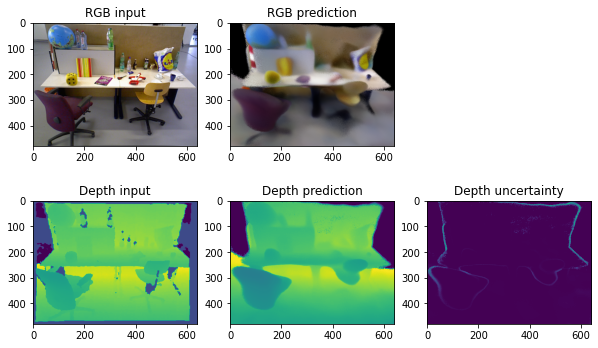

Depth residual: 0.13460831 RGB residual: 0.14515543


In [30]:
# Kill previously running threads
try:
    sharedData.run_mapping = False
    sharedData.run_tracking = False
    mappingThread.join()
    trackingThread.join()
except:
    pass

keyframe_no = 0

loss_rgb, loss_depth = render_scene(sharedData.scene_model,
                                    mappingThread.keyframes_poses[keyframe_no],
                                    mappingThread.keyframes_depth[keyframe_no],
                                    mappingThread.keyframes_rgb[keyframe_no],
                                    plot=True,
                                    raw_scale=raw_scale,
                                    raw_noise_std=raw_noise_std)
print('Depth residual:', loss_depth, 'RGB residual:', loss_rgb)

## Save trajectory to file

In [31]:
trajectory_timestamps = [t[0] for t in sharedData.trajectory]
trajectory_poses = [t[1] for t in sharedData.trajectory]
axes, angles = tf.linalg.normalize(tf.convert_to_tensor(trajectory_poses)[...,1], axis=1)
quaternions = transformation.quaternion.from_axis_angle(axes, angles)

print('Writing to ' + dataset['directory'] + 'trajectory.txt')

with open(dataset['directory'] + 'trajectory.txt', 'w') as file:
    for frame_idx in range(len(sharedData.trajectory)):
        file.write(str(trajectory_timestamps[frame_idx]) + ' ')
        file.write(' '.join(trajectory_poses[frame_idx][:,0].numpy().astype('str').tolist()) + ' ')
        file.write(' '.join(quaternions[frame_idx].numpy().astype('str').tolist()) + '\n')

print('Done!')

Writing to rgbd_dataset_freiburg3_long_office_household/trajectory.txt
Done!


## Run TUM evaluation tools

compared_pose_pairs 2485 pairs
absolute_translational_error.rmse 0.107479 m
absolute_translational_error.mean 0.095969 m
absolute_translational_error.median 0.087228 m
absolute_translational_error.std 0.048391 m
absolute_translational_error.min 0.008332 m
absolute_translational_error.max 0.311654 m


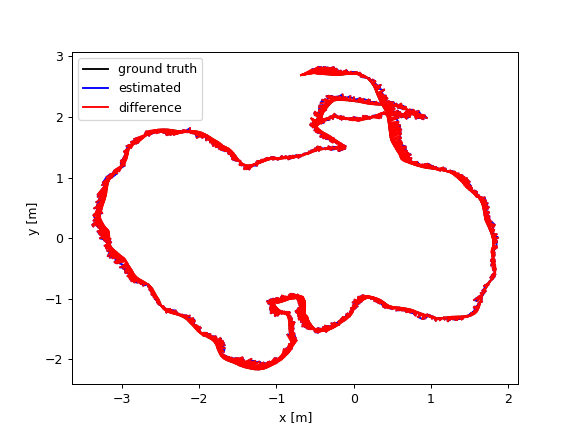

In [32]:
!python2 evaluate_ate.py --verbose --max_difference "{0.02 / dataset['time_scaling_factor']}" --plot ate.png "{dataset['directory']}groundtruth.txt" "{dataset['directory']}trajectory.txt"
PIL.Image.open('ate.png')

In [33]:
!python2 evaluate_rpe.py --verbose "{dataset['directory']}groundtruth.txt" "{dataset['directory']}trajectory.txt"

compared_pose_pairs 10000 pairs
translational_error.rmse 0.229117 m
translational_error.mean 0.183959 m
translational_error.median 0.151513 m
translational_error.std 0.136579 m
translational_error.min 0.000000 m
translational_error.max 1.291574 m
rotational_error.rmse 6.806656 deg
rotational_error.mean 5.931232 deg
rotational_error.median 5.437817 deg
rotational_error.std 3.339319 deg
rotational_error.min 0.000000 deg
rotational_error.max 21.592664 deg


## Visualise estimated vs. ground-truth coordinates

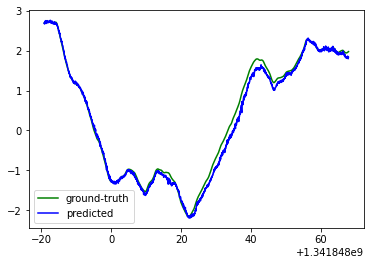

In [34]:
coordinate = 1 # [0,1,2] = [X,Y,Z]

gt_timestamps = [gt[0] for gt in gt_poses]
gt_translations = [gt[1][coordinate,0] for gt in gt_poses]
trajectory_timestamps = [t[0] for t in sharedData.trajectory]
trajectory_translations = [t[1][coordinate,0] for t in sharedData.trajectory]
plt.plot(gt_timestamps, gt_translations, 'g-')
plt.plot(trajectory_timestamps, trajectory_translations, 'b-')
plt.legend(['ground-truth', 'predicted'])
plt.show()

## Reconstruct scene mesh

In [41]:
def batchify(fn, chunk):
    if chunk is None:
        return fn
    def ret(inputs):
        return tf.concat([fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], 0)
    return ret

def get_scene_mesh(scene_model):
    ranges = dataset['reconstruction_bounds']
    n_voxels = 200

    x = tf.linspace(ranges[0,0], ranges[0,1], n_voxels+1) / dataset['normalisation_factor']
    y = tf.linspace(ranges[1,0], ranges[1,1], n_voxels+1) / dataset['normalisation_factor']
    z = tf.linspace(ranges[2,0], ranges[2,1], n_voxels+1) / dataset['normalisation_factor']

    query_pts = tf.stack(tf.meshgrid(x, y, z), -1)
    pts_flat = tf.reshape(query_pts, [-1, 3])

    sample_points = batchify(scene_model, 1024*64)

    raw = sample_points(pts_flat)
    raw = tf.reshape(sample_points(pts_flat), list(query_pts.shape[:-1]) + [-1])
    density = tf.nn.relu(raw[..., 3]).numpy()
    rgb = tf.nn.sigmoid(raw[..., :3])

    threshold = tf.math.reduce_std(density).numpy()

    vertices, faces, normals, _ = measure.marching_cubes_lewiner(density,
                                                                 0.1 * threshold,
                                                                 spacing=((ranges[1,1]-ranges[1,0]) / n_voxels,
                                                                         (ranges[0,1]-ranges[0,0]) / n_voxels,
                                                                         (ranges[2,1]-ranges[2,0]) / n_voxels),
                                                                 allow_degenerate=False)
    vertices = np.array(vertices)[:,[1,0,2]] + np.array([[ranges[0,0], ranges[1,0], ranges[2,0]]])
    normals = np.array(normals)[:,[1,0,2]]
    raw = sample_points(vertices / dataset['normalisation_factor'])
    rgb_vertices = tf.nn.sigmoid(raw[..., :3]).numpy()

    return trimesh.Trimesh(vertices, faces, vertex_normals=normals, vertex_colors=rgb_vertices)

def get_trajectory_path_up_to_frame(frame_idx, keyframes_indices, keyframes_poses, trajectory, gt_poses=None):
    # Render cameras
    camera_poses = frame_pose_to_homogeneous_mat(keyframes_poses)
    cameras = []
    for i in range(len(keyframes_indices)):
        if keyframes_indices[i] > frame_idx:
            break
        camera = trimesh.creation.camera_marker(trimesh.scene.Camera(focal=(dataset['camera_fx'], dataset['camera_fy']), resolution=(dataset['img_w'],dataset['img_h'])), marker_height=.3)
        camera[1].colors = np.ones((5, 4), dtype=np.uint8) * [[0, 0, 255, 255]]
        camera[1].apply_transform(camera_poses[i])
        cameras.append(camera[1])

    camera = trimesh.creation.camera_marker(trimesh.scene.Camera(focal=(dataset['camera_fx'], dataset['camera_fy']), resolution=(dataset['img_w'],dataset['img_h'])), marker_height=.3)
    camera[1].colors = np.ones((5, 4), dtype=np.uint8) * [[0, 255, 0, 255]]
    camera[1].apply_transform(frame_pose_to_homogeneous_mat(trajectory[frame_idx][1][None,...])[0])
    cameras.append(camera[1])

    # Render estimated path
    trajectory_cut = trajectory[:(frame_idx+1)]
    path = trimesh.path.Path3D(entities=[trimesh.path.entities.Line([*range(len(trajectory_cut))])],
                            vertices=[t[1][:,0] for t in trajectory_cut],
                            colors=[[0, 0, 255, 255]])
    
    objects = cameras + [path]
    
    if gt_poses is not None:
        # Render ground-truth path
        gt_trajectory = [gt[1][:,0] for gt in gt_poses]
        path_gt = trimesh.path.Path3D(entities=[trimesh.path.entities.Line([*range(len(gt_trajectory))])],
                                vertices=gt_trajectory,
                                colors=[[0, 255, 0, 255]])
        objects.append(path_gt)
        
    return objects

def get_scene(scene_model,
              keyframes_indices,
              keyframes_poses,
              trajectory,
              gt_poses=None,
              scene_transform=np.eye(4),
              camera_angles=[0., 0., 0.],
              camera_distance=5.):
    paths = get_trajectory_path_up_to_frame(len(trajectory)-1,
                                            keyframes_indices,
                                            keyframes_poses,
                                            trajectory,
                                            gt_poses)
    mesh = get_scene_mesh(scene_model)
    camera = trimesh.scene.Camera(name='camera', resolution=[1280, 720], fov=[90, 60], z_near=0.01, z_far=20.0)
    scene = trimesh.Scene([mesh] + paths, camera=camera)
    scene.apply_transform(scene_transform)
    scene.set_camera(distance=camera_distance, angles=camera_angles)

    return scene

## Render scene inline via WebGL

In [36]:
trimesh_scene = get_scene(sharedData.scene_model,
                          mappingThread.keyframes_indices,
                          mappingThread.keyframes_poses,
                          sharedData.trajectory,
                          gt_poses)
trimesh_scene.show()

## Render scene to file
Seethe comment about pyglet in the beginning of this notebook

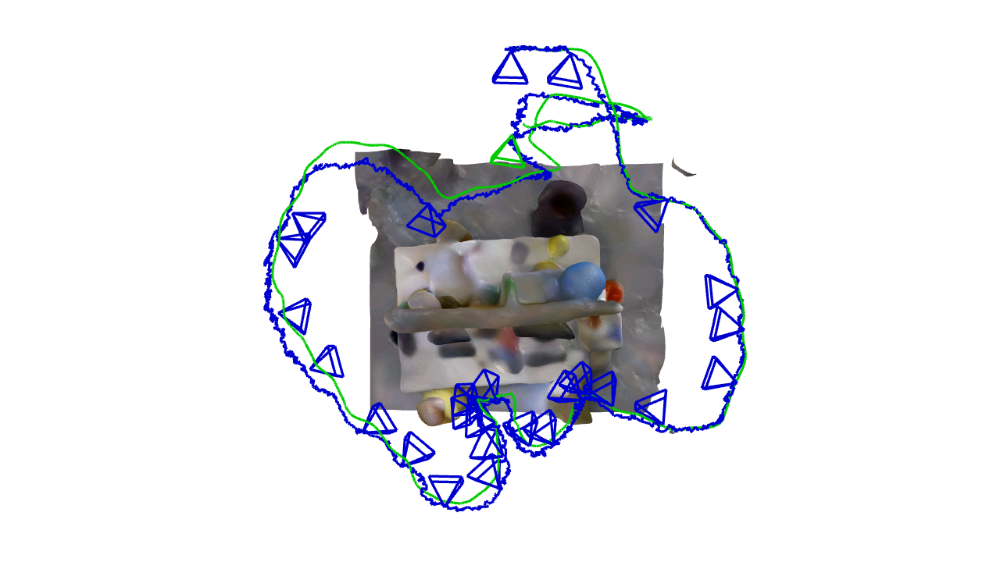

In [42]:
trimesh_scene = get_scene(sharedData.scene_model,
                          mappingThread.keyframes_indices,
                          mappingThread.keyframes_poses,
                          sharedData.trajectory,
                          gt_poses,
                          camera_distance=8.)
png = trimesh_scene.save_image(resolution=[1280, 720], visible=False)

filename = 'example.png'
with open(filename, 'wb') as f:
    f.write(png)
    f.close()

PIL.Image.open(filename)